# Predictive Data Analysis: Florida Cypress Wetlands, Between Two Seasons

## Introduction

I will be performing a network analysis on two network datasets from the Pajek datasets repository. Specifically I will be using the datasets that model 1.) the wet season and 2.) the dry season. Both of these are trophic networks made to represent the Florida Cypress Wetlands, with some variation in edges throughout the two seasons. In the network, nodes represent an individual "taxon" or anything that exchanges carbon in a network. This can include animals, plants, bacteria and even respiration/other chemical exchanges that include carbon. An edge in the network signifies that two taxa have a carbon exchange with each other. These edges are also directed, signifying that the "predator node" or the node that initiates the carbon exchange and gains from it has an edge pointing in from a "prey node". The "prey node" can also be looked at as a predecessor of the "predator node". 

My main goal in conducting the research on these networks is to identify what communities exist in the wetlands and how these match up to the trophic levels, what the most central nodes are and if these are predators at the top of the food chain or something else, and finally I will use machine learning to predict what nodes are likely to be of great importance and what links are likely to form from the wet season to the dry season. The edges in this case actually represent carbon exchanges not just one animal consuming another. It could be one animal consuming another animal, but it can also carbon exchanges between plants, respiration, etc.

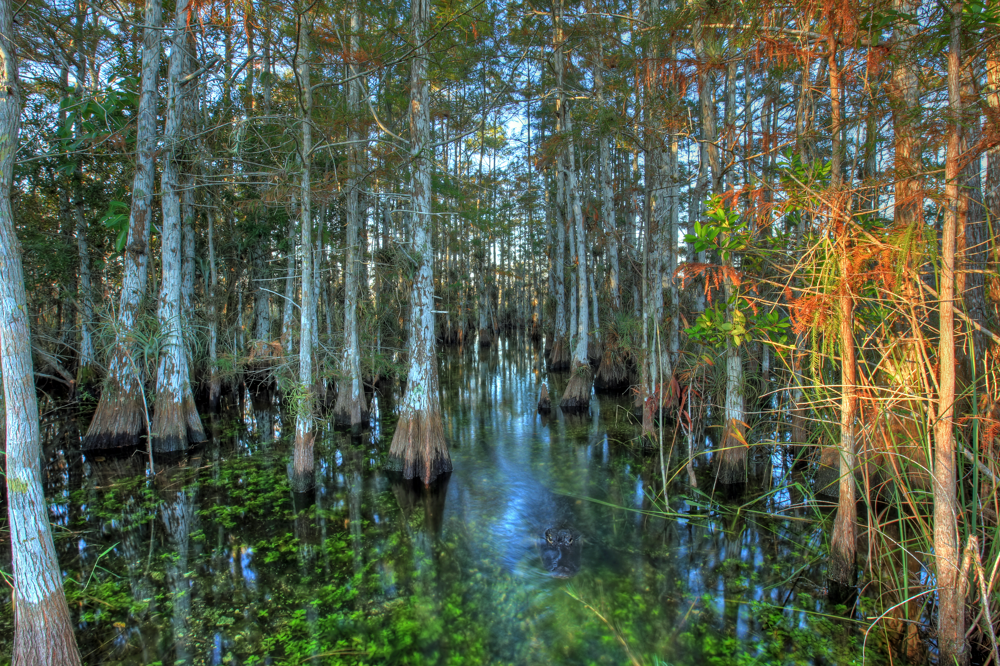

## Identifying my Research Questions

As previously stated, my research questions are related to the ecosystem of the Florida Cypress Wetlands, and how trophic levels, centrality and more effect the place of a taxon in the network. 

My specific questions will be as follows:
- What are the most central nodes in the network, and are these just the predators at the top of the food chain or is there something else driving their centrality?
- What communities exist in the network, and how does this match up with the trophic levels of a given species/taxon?
- How would a cascading of this network effect its carbon exchanges? Specifically, does a removing a certain portion of a nodes carbon exchanges affect its ability to survive in the network?
- How accurate are machine learning methods such as link prediction and node classification in predicting what relationships are likely to form between the wet season and the dry season, and how accurate is this?

Combining these into one broader question about the network, my main research question will :

**How can I predict changes across the two seasons of the wetlands, and how do communities, cascading of the networks carbon exchanges, and node centrality play into how these predictions turn out?**

The original networks and files can be found here:

**Website**: http://vlado.fmf.uni-lj.si/pub/networks/data/bio/foodweb/foodweb.htm

**Files**:
-Pajek Florida Ecosytem Wet Dataset: http://vlado.fmf.uni-lj.si/pub/networks/data/bio/foodweb/cypwet.paj
-Pajek Florida Ecosystem Dry Dataset: http://vlado.fmf.uni-lj.si/pub/networks/data/bio/foodweb/cypdry.paj

## Describing the Network

Here I will use descriptive analysis methods to describe the network and to carry out my research questions. It'll be important to calculate various metrics including centrality measures and community detection to test them. Additionally, creating visualizations of the the network and of these calculations will allow for easy visual representation and evidence towards the answers of the research questions.

### Importing the Network

In [12]:
# importing data science libraries i'll be working with
import pandas as pd
import networkx as nx
import altair as alt 
import nx_altair as nxa

In [13]:
file_path = "/Users/jacobsinclair/Desktop/CISClasses/CIS397Networks/Project3/cypwet.paj"

# Read the Pajek dataset
pajek_graph = nx.read_pajek(file_path)
wet = nx.DiGraph(pajek_graph)
print(wet)

DiGraph named 'cypwet.dat' with 74 nodes and 633 edges


In [14]:
file_path = "/Users/jacobsinclair/Desktop/CISClasses/CIS397Networks/Project3/cypdry.paj"

# Read the Pajek dataset
pajek_graph = nx.read_pajek(file_path)
dry = nx.DiGraph(pajek_graph)
print(dry)

DiGraph named 'cypdry.dat' with 74 nodes and 642 edges


### Setting Important Node Attributes

Here, the degree, out-degree and in-degree will be important to classifying nodes. A high degree would indicate that a taxon has a lot of carbon exchanges with other taxa, while high in-degree would signify that it has a lot of predator relationships with other nodes, and high out-degree would signify that it is the prey for many predator nodes. 

In [17]:
# Adding attributes to the graph to display
degree = nx.degree_centrality(wet) # Add degree centrality

# Add all attributes to graph
nx.set_node_attributes(wet, degree, 'degree_centrality')

# Calculate in-degree and out-degree
in_degree = dict(wet.in_degree)  # Calculate in-degree
out_degree = dict(wet.out_degree)  # Calculate out-degree

# Set node attributes
nx.set_node_attributes(wet, in_degree, "in_degree")
nx.set_node_attributes(wet, out_degree, "out_degree")

In [18]:
# Adding attributes to the graph to display
degree = nx.degree_centrality(dry) # Add degree centrality

# Add all attributes to graph
nx.set_node_attributes(dry, degree, 'degree_centrality')

# Calculate in-degree and out-degree
in_degree = dict(dry.in_degree)  # Calculate in-degree
out_degree = dict(dry.out_degree)  # Calculate out-degree

# Set node attributes
nx.set_node_attributes(dry, in_degree, "in_degree")
nx.set_node_attributes(dry, out_degree, "out_degree")

In [19]:
# assigning taxon names to nodes

for n,d in wet.nodes.data():
    d['taxon'] = n
    
for n,d in dry.nodes.data():
    d['taxon'] = n

### Creating DataFrames to Display Data

In [21]:
# Convert nodes to a dataframe
wet_nodes = pd.DataFrame.from_dict(wet.nodes, orient='index')
wet_nodes.reset_index(level=0,inplace=True)
sorted_nodes = wet_nodes.sort_values(by='in_degree', ascending=False)
sorted_nodes

,index,id,degree_centrality,in_degree,out_degree,taxon
70,Respiration,71,0.863014,63,0,Respiration
67,Vert. det,68,0.698630,46,5,Vert. det
25,Snakes,26,0.547945,24,16,Snakes
22,Alligators,23,0.465753,23,11,Alligators
66,Liable Det.,67,0.438356,21,11,Liable Det.
...,...,...,...,...,...,...
34,Vultures,35,0.041096,1,2,Vultures
51,Bats,52,0.041096,1,2,Bats
68,Input,69,0.273973,0,20,Input
71,*vector,NaN,0.013699,0,1,*vector


In sorting this DataFrame by in degree we can see that some of the nodes that we would expect to be the highest predators are here, such as snakes and aligators. But we can also see that respiration is the highest of the in degrees as it has the most interactions of this type with other taxa. 

In [23]:
# Convert nodes to a dataframe
dry_nodes = pd.DataFrame.from_dict(dry.nodes, orient='index')
dry_nodes.reset_index(level=0,inplace=True)
sorted_nodes = dry_nodes.sort_values(by='in_degree', ascending=False)
sorted_nodes

,index,id,degree_centrality,in_degree,out_degree,taxon
70,Respiration,71,0.863014,63,0,Respiration
67,Vertebrate Det.,68,0.698630,46,5,Vertebrate Det.
25,Snakes,26,0.561644,27,14,Snakes
22,Alligators,23,0.410959,22,8,Alligators
54,Raccoon,55,0.328767,21,3,Raccoon
...,...,...,...,...,...,...
34,Vultures,35,0.041096,1,2,Vultures
51,Bats,52,0.041096,1,2,Bats
68,Input,69,0.273973,0,20,Input
71,*vector,NaN,0.013699,0,1,*vector


In sorting this DataFrame by in degree we can see that some of the nodes that we would expect to be the highest predators are here, such as snakes and aligators as well as respiration, similar in the previous DataFrane. But we can also see that raccoons become one of the top predators with in the dry season. This is interesting but makes sense as they may have more opportunity to hunt in this season.

In [25]:
edges = pd.DataFrame.from_dict(wet.edges, orient='index')
edges

weight
Alligators  Black Bear     5.160000e-05
            GB Heron       2.330000e-04
            Kites & Hawks  8.750000e-05
            Mink           2.710000e-07
            Owls           3.070000e-04
...                                 ...
Woodpeckers Egrets         2.790000e-04
            Other Herons   2.490000e-05
            Respiration    3.140000e-03
            Snakes         1.950000e-04
            Vert. det      1.700000e-03

[631 rows x 1 columns]

In [26]:
edges = pd.DataFrame.from_dict(dry.edges, orient='index')
edges

weight
Alligators  Great blue heron  0.000346
            Kites & Hawks     0.000382
            Owls              0.000672
            Respiration       0.039000
            Snakes            0.046100
...                                ...
Wood stork  Vertebrate Det.   0.043600
Woodpeckers Other herons      0.000201
            Respiration       0.003130
            Snakes            0.000334
            Vertebrate Det.   0.001870

[640 rows x 1 columns]

In examining these two DataFrames, we can see some of the edges that change between the wet season and the dry season. For example if we look at alligators, some of their carbon exchanges in the wet season include black bears, great blue herons, kites/hawks, mink and owls, but they have an edge with snakes in the dry season. It also seems that the weight of alligators' edges with other nodes are of higher weight in the dry season meaning they are more prevalent and occuring more often.

## Degree Distribution

We can also look at the degree distribution of the wet network to see if it matches with what we expect to see. As well as the in-degree to see if there are a lot of predators in the network.

In [30]:
# Creating a distribution graph for degree
degree_distribution = alt.Chart(wet_nodes, title="Distribution of Degree").mark_bar().encode(
    x=alt.X('degree_centrality').bin().title('Degree'),
    y='count()',
)

in_degree_distribution = alt.Chart(wet_nodes, title="Distribution of In-Degree").mark_bar().encode(
    x=alt.X('in_degree').bin().title('In-Degree'),
    y='count()',
)

degree_distribution | in_degree_distribution

alt.HConcatChart(...)

In the distribution of degree it seems that there are a lot of nodes with low degree and very few with high degree. Meaning the few nodes with high degree have many carbon exchange interactions with other nodes. The same is true obviously for in-degree, and it seems that the high degree nodes may also match up with the high in-degree nodes, signifying that these may be our highest food chain predators.

### Visualizing the Networks

In [33]:
# setting the graph to start in a "force atlas" layout similar to static visualization in Gephi
pos = nx.spring_layout(wet) 

In [34]:
# drawing a plot of the graph
alt.data_transformers.disable_max_rows()
wet_viz = nxa.draw_networkx(wet, 
                        pos=pos, 
                        node_color='in_degree', 
                        edge_color='pink',
                        node_size='degree_centrality',
                        node_tooltip=['taxon', 'degree_centrality','in_degree', 'out_degree']
                       )

In [35]:
wet_viz.interactive()

alt.LayerChart(...)

In this visualization of the dry season, we can see that there is a lot of clustering in the middle. Which seems to have a lot of aquatic based animals in the middle with hybrid animals surrounding such as alligators, frogs, otters, snakes, and white ibis.

In [37]:
# setting the graph to start in a "force atlas" layout similar to static visualization in Gephi
pos = nx.spring_layout(dry) 

In [38]:
# drawing a plot of the graph
alt.data_transformers.disable_max_rows()
dry_viz = nxa.draw_networkx(dry, 
                        pos=pos, 
                        node_color='in_degree', 
                        edge_color='pink',
                        node_size='degree_centrality',
                        node_tooltip=['taxon', 'degree_centrality','in_degree', 'out_degree']
                       )

In [39]:
dry_viz.interactive()

alt.LayerChart(...)

In this visualization of the dry season, we can see that there is a lot of clustering in the middle again. This time the nodes in this clustering are a lot land based animals such as deer, raccoons, squirrels, opossum, and snakes, but there are also a lot of animals that are hybrid like snakes, turtles, ibis, and storks.

### Community Detection

I had previously stated that I wanted to investigate what communities exist in the network and how these compare to the trophic levels. A trophic level signifys a level of the food chain with similar types of consumers. For example in the Apex Predators level we might expect to see alligators here in the case of our network, where as we might expect to see deer in the primary consumers level as they are herbivores. 

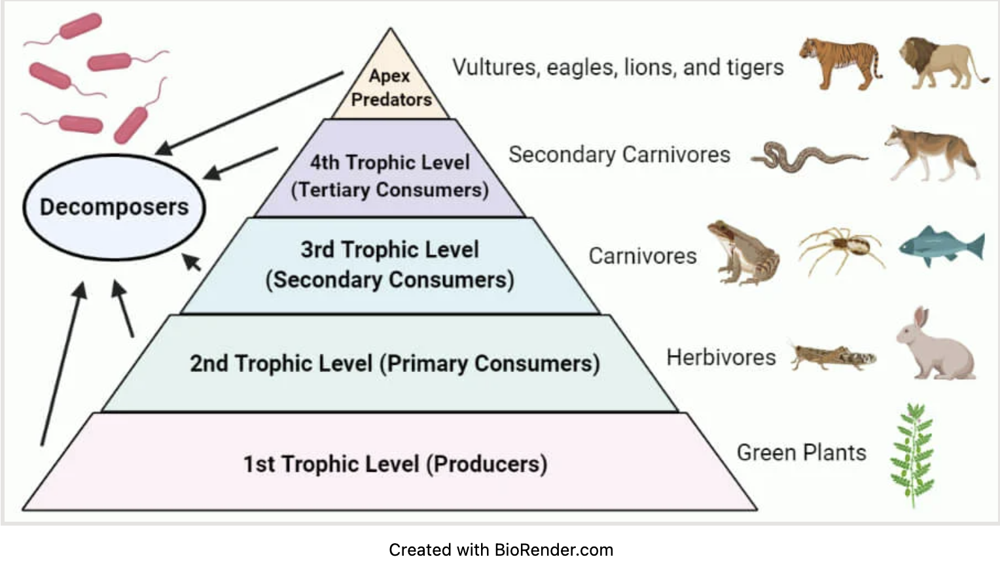

This image gives us a basic idea of what the pyramid of trophic levels looks like and we can use this as reference to see how our community detection matches up.

### Calculating Trophic Levels

NetworkX has a built in algorithm to figure out which nodes belong to which trophic levels. I will use this below as a baseline to assign trophic levels to all the nodes in the network.

In [47]:
wet_trophic_levels = nx.algorithms.centrality.trophic_levels(wet)

# Convert trophic levels to integers
wet_trophic_levels_int = {node: int(level) for node, level in wet_trophic_levels.items()}

# Assign trophic levels as node attributes
nx.set_node_attributes(wet, wet_trophic_levels_int, name='trophic_level')

In [48]:
dry_trophic_levels = nx.algorithms.centrality.trophic_levels(dry)

# Convert trophic levels to integers
dry_trophic_levels_int = {node: int(level) for node, level in dry_trophic_levels.items()}

# Assign trophic levels as node attributes
nx.set_node_attributes(dry, dry_trophic_levels_int, name='trophic_level')

### Louvain Partition

In using community detection, and specifically louvain partition, we can see what groups the algorithm expects to see in the network, and compare how this matches up with the results of the trophic levels algorithm.

In [51]:
# Importing essential function for working with the algorithm
from networkx.algorithms.community import louvain_communities

# Run the algorithm with a random seed, so it's the same each time
louvain = louvain_communities(wet, seed=40)
#print(louvain)

num_weakly_connected_components = nx.number_weakly_connected_components(wet)
num_strongly_connected_components = nx.number_strongly_connected_components(wet)
print(num_weakly_connected_components, num_strongly_connected_components)

2 22


In [52]:
louvain_dict = {}
for i,group in enumerate(louvain):
    for g in group:
        louvain_dict[g] = i
        
#print(louvain_dict)

In [53]:
nx.set_node_attributes(wet, louvain_dict, "louvain_partition")

### Comparing Community Detection and Trophic Levels

Now I will look at the similarities and differences of the calculated louvain partition and trophic levels.

In [56]:
# setting the graph to start in a "force atlas" layout similar to static visualization in Gephi
pos = nx.spring_layout(wet) 
# drawing a plot of the graph
alt.data_transformers.disable_max_rows()
viz = nxa.draw_networkx(wet, 
                        pos=pos, 
                        node_color='louvain_partition:N', 
                        edge_color='pink',
                        cmap='rainbow',
                        node_size=300,
                        node_tooltip=['louvain_partition', 'trophic_level', 'taxon']
                       )

In [57]:
viz.interactive()

alt.LayerChart(...)

In looking at the visualization, we can see that there are 5 different partitions. This matches up with our expected 5 trophic levels and the partitions seem to match up reasonably well with the actual trophic levels.

In [59]:
nodes = pd.DataFrame.from_dict(wet.nodes, orient='index')
nodes.reset_index(level=0,names="node_id",inplace=True)
nodes.sort_values("trophic_level", ascending=False, inplace=True)
nodes

,node_id,id,degree_centrality,in_degree,out_degree,taxon,trophic_level,louvain_partition
34,Vultures,35,0.041096,1,2,Vultures,6,1
27,L Frog,28,0.205479,7,8,L Frog,5,1
56,Otter,57,0.164384,10,2,Otter,5,0
22,Alligators,23,0.465753,23,11,Alligators,5,1
21,L Fish,22,0.287671,9,12,L Fish,5,1
...,...,...,...,...,...,...,...,...
38,GB Heron,39,0.287671,18,3,GB Heron,2,1
39,Other Herons,40,0.328767,21,3,Other Herons,2,1
68,Input,69,0.273973,0,20,Input,1,2
71,*vector,NaN,0.013699,0,1,*vector,1,4


When we look at the DataFrame though, we can see that there are 6 defined trophic levels with vultures being the only one in the 6th level. Apart from this outlier, it seems that louvain partition and trophic level have matched up relatively well.

### Regression Plot

We can test how well louvain partition and trophic level match up with the use of a regression plot. I will plot louvain partition on the x axis and trophic level on the y axis.

In [63]:
# Create scatter plot
regression = alt.Chart(nodes, title="Regression of Louvain Partition and Trophic Level").mark_point().encode(
    x=alt.X('louvain_partition', title='Louvain Partition'),
    y=alt.Y('trophic_level', title='Trophic Level'),
   
)

# Add regression line
regression_line = regression.transform_regression('louvain_partition', 'trophic_level').mark_line(color='red')

# Combine scatter plot and regression line
regression + regression_line

alt.LayerChart(...)

At best there seems to be a very, very slight negative correlation between the two. The negative correlation makes sense as the two measures are reversed in their numbering schemes, but the correlation is very weak. This could be due to slight differences in categorization of nodes. 

## Using Predictive Measures on the Network

### Trophic Cascade

Using a combination of information cascade techniques and epidemic modeling techniques, I will model a trophic cascade on this network. In doing so I will attempt to model what would happen to the ecosystem of the Cypress Wetlands if some of the taxa died/were removed, and how this would effect the carbon exchanges and overall structure of the network.

In [68]:
import random
from random import choices

# Setting the status of nodes in the network
for n,d in wet.nodes.data():
    d['initial status'] = 'alive'
    d['status'] = 'alive'

nodes_list = list(wet.nodes())
initial_dead_nodes = random.sample(nodes_list, 10)

# Change the status of initially chosen nodes to dead
for node in initial_dead_nodes:
    wet.nodes[node]['initial status'] = 'dead'
    wet.nodes[node]['status'] = 'dead'

### Explanation of Choices For Methods of Simulation

Rather than using a threshold for switching behaviors as seen in cascading networks of decison making,
it makes sense to use a stochastic process instead. Specifically, it doesn't make sense that a species would choice
to die or to stay alive. 

Therefore I will instead determine a threshold percentage of carbon exchanges absent from a node's
predecessors to signify that it should die. This will be done by a random choice between whether the species should live or
die and will have determined probabilities for each choice. The more predecessors that are dead from a given node, increases
the chance that it will die. 

The probability should be the portion of its neighbors that are dead / the proportion of its neighbors that are alive.

### Simulation of Trophic Cascade

In [72]:
# simulating the deterioration of the ecosystem and what the effect of killing or removing 
# these organisms/elements to the ecosystem could be. 

# I will use a combination of cascade techniques and epidemic modeling techniques. 
# Specifically, I will use the cascade method of changing behaviors of a node, but here "behavior"
# will represent the status of a node (alive/dead) rather than a decision making process. 

# I will use the stochastic processes involved in epidemic modeling. Specifically, in the case that one or more of a node's
# predecessors have been removed from the network, there will be a randomized choice between if they get removed or not.
# This is a simplified approach, and does not account for many of the involved biological/ecological processes, but represents
# a start to modeling the potential cascading of a biological network.

def trophic_cascade_step():

    nodes_to_change = []
    
    # for loop for each node
    for n, d in wet.nodes(data=True):
        predecessors = list(wet.predecessors(node))  # Get predecessors of the current node
        dead_predecessors = [n for n in predecessors if wet.nodes[n]['status'] == 'dead']  # Filter out dead predecessors
        dead_count = len(dead_predecessors)
        total_predecessors = len(predecessors)
        
        if len(dead_predecessors) > 0:
            p_dead = dead_count / total_predecessors
            if choices(['dead', 'alive'], weights=[p_dead, 1-p_dead], k=1)[0] == 'dead':
                wet.nodes[n]['status'] = 'dead'
                
    alt.data_transformers.disable_max_rows()
    viz = nxa.draw_networkx(wet, pos=nx.spring_layout(wet, seed = 42), node_color = 'status', node_tooltip = ['taxon', 'status', 'trophic_level'])
    return viz   

In [73]:
initial_viz = nxa.draw_networkx(wet, pos=nx.spring_layout(wet, seed = 42), node_color = 'initial status', node_tooltip = ['taxon', 'status'])
initial_viz.interactive()

alt.LayerChart(...)

In [74]:
plots = []

def run_simulation():
    for i in range(5):
        viz = trophic_cascade_step()
        plots.append(viz)
        # Assuming HS is accessible within this function and is a NetworkX graph
        for n, d in wet.nodes.data():
            d[str("status after run " + str(i+1))] = d['status']

    return alt.hconcat(*plots)

In [75]:
run_simulation()

alt.HConcatChart(...)

In [76]:
nodes_pd = pd.DataFrame.from_dict(dict(wet.nodes(data=True)), orient = 'index')
nodes_pd = nodes_pd.sort_values(by='trophic_level', ascending=False)
nodes_pd

,id,degree_centrality,in_degree,out_degree,taxon,trophic_level,louvain_partition,initial status,status,status after run 1,status after run 2,status after run 3,status after run 4,status after run 5
Vultures,35,0.041096,1,2,Vultures,6,1,alive,dead,alive,alive,dead,dead,dead
L Frog,28,0.205479,7,8,L Frog,5,1,alive,dead,alive,dead,dead,dead,dead
Otter,57,0.164384,10,2,Otter,5,0,dead,dead,dead,dead,dead,dead,dead
Alligators,23,0.465753,23,11,Alligators,5,1,alive,dead,alive,dead,dead,dead,dead
L Fish,22,0.287671,9,12,L Fish,5,1,dead,dead,dead,dead,dead,dead,dead
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GB Heron,39,0.287671,18,3,GB Heron,2,1,alive,dead,alive,alive,dead,dead,dead
Other Herons,40,0.328767,21,3,Other Herons,2,1,dead,dead,dead,dead,dead,dead,dead
Input,69,0.273973,0,20,Input,1,2,alive,dead,alive,dead,dead,dead,dead
*vector,NaN,0.013699,0,1,*vector,1,4,alive,dead,alive,dead,dead,dead,dead


In looking at the row of visualizations and at the DataFrame, we can see the results of the cascade. In running the cascade many times it has come to my attention that whether the network sees a full trophic cascade is contingent on which nodes start out as dead. It is also likely that these are some of the most central and inter-connected nodes in the network. In this case there was a full cascade.

### Machine Learning and Statistical Modeling

Here I will use machine learning and statistical modeling to use machine learning to predict what nodes are likely to be of great importance and what links are likely to form from the wet season to the dry season.

In [80]:
from sklearn.cluster import KMeans
from stellargraph.data import BiasedRandomWalk
from stellargraph import StellarGraph
from gensim.models import Word2Vec

In [81]:
# use link prediction to predict which new edges will form from wet season to dry season
# in the event that a nodes prey die off which are the new animals/plants it is likely to consume

# use node classification to see which nodes are of greatest importance, and to see if similar nodes are in the 
# same community/trophic level

#### Link Prediction

In [83]:
# Predict scores for all nodes that are not currently linked (have an edge)
wet_undirected = wet.to_undirected()
predictions = nx.preferential_attachment(wet_undirected)

# Sort list based on prediction score
sorted_predictions = sorted(predictions, key=lambda x: x[2], reverse=True)

# Print out the 10 most likely links
for u,v,p in sorted_predictions[:20]:
    print(f"{u, v} Score: {p}")

('Vert. det', 'Respiration') Score: 3087
('Liable Det.', 'Respiration') Score: 1575
('Refractory Det.', 'Respiration') Score: 1575
('Vert. det', 'Aquatic I') Score: 1470
('Aquatic I', 'Terrst. I') Score: 1440
('Crayfish', 'Vert. det') Score: 1372
('Vert. det', 'Prawn') Score: 1372
('Crayfish', 'Terrst. I') Score: 1344
('Terrst. I', 'Prawn') Score: 1344
('Apple Snail', 'Vert. det') Score: 1323
('Apple Snail', 'Terrst. I') Score: 1296
('Respiration', 'Input') Score: 1260
('Hardwood L', 'Vert. det') Score: 980
('Vert. det', 'Input') Score: 980
('Vert. det', 'Understory') Score: 980
('Terrst. I', 'Input') Score: 960
('Crayfish', 'Fish PC') Score: 952
('Snakes', 'Liable Det.') Score: 900
('Snakes', 'Refractory Det.') Score: 900
('Crayfish', 'Fish HO') Score: 896


Here we can see the 20 most likely links to form in the future based on the wet season network. To compare this we can see if any of these edges exist in the dry season network.

In [85]:
# Initialize a list to store edges that exist in the dry network
existing_edges = []

# Iterate over the sorted predictions
for u, v, p in sorted_predictions[:20]:
    # Check if the edge exists in the dry network
    if dry.has_edge(u, v):
        existing_edges.append((u, v, p))

# Print out the existing edges
if existing_edges:
    print("Existing edges in the dry network:")
    for u, v, p in existing_edges:
        print(f"{u}-{v} Score: {p}")
else:
    print("No existing edges found in the dry network.")


No existing edges found in the dry network.


Above we can see that none of these most likely edges actually end up existing in the dry network. This may be due to the fact that many of the species already know which relationships are important to them, and instinctually do not need to form new relationships. It is also possible that in the case of a cascading network, and lack of resources, taxa may be more likely to form new relationships to aquire the carbon exchanges that they need. 

#### Node Classification

Using node classification, we can identify important groupings, and similar nodes, to test the validity of our communities and trophic levels.

In [89]:
# creating a StellarDiGraph object

In [90]:
S = StellarGraph.from_networkx(wet)
print(S.info())

StellarDiGraph: Directed multigraph
 Nodes: 74, Edges: 633

 Node types:
  default: [74]
    Features: none
    Edge types: default-default->default

 Edge types:
    default-default->default: [633]
        Weights: range=[2.81e-08, 433], mean=6.30666, std=33.7772
        Features: none


In [91]:
# performing random walks so the model can learn more about the network

In [92]:
rw = BiasedRandomWalk(S)

walks = rw.run(
    nodes=list(wet.nodes()),  # root nodes
    length=100,  # maximum length of a random walk
    n=10,  # number of random walks per root node
    p=0.5,  # Defines (non-normalised) probability, 1/p, of returning to source node
    q=2.0,  # Defines (non-normalised) probability, 1/q, for moving away from source node
)
print("Number of random walks: {}".format(len(walks)))

Number of random walks: 740


In [93]:
str_walks = [[str(n) for n in walk] for walk in walks]
model = Word2Vec(str_walks, window=5, min_count=0, sg=1, workers=2)

#### Testing the Node Classification

I will select one node from each trophic level defined by the earlier algorithm, and then see if its most similar nodes are those with the same trophic level.

In [96]:
# this function will tell us what percentage of the most similar nodes share a trophic level to the selected node

def classification_accuracy(num_matches):
    accuracy = num_matches/10
    return accuracy

In [97]:
# Trophic Level 1
level1 = model.wv.most_similar("Input")

In [98]:
# List of top ten items
top_ten_names1 = [item[0] for item in level1]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names1 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"{node}, Trophic Level: {trophic_level}")

Refractory Det., Trophic Level: 3
Liable Det., Trophic Level: 3
Cypress W, Trophic Level: 2
Hardwood W, Trophic Level: 2
Roots, Trophic Level: 2
Vine L, Trophic Level: 2
Cypress L, Trophic Level: 2
Epiphytes, Trophic Level: 2
Float Veg., Trophic Level: 2
Periphyton, Trophic Level: 2


In [99]:
classification_accuracy(0)

0.0

In [100]:
# Trophic Level 2
level2 = model.wv.most_similar("GB Heron")

In [101]:
# List of top ten items
top_ten_names2 = [item[0] for item in level2]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names2 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"Node: {node}, Trophic Level: {trophic_level}")

Node: Kites & Hawks, Trophic Level: 5
Node: Wood stork, Trophic Level: 2
Node: Owls, Trophic Level: 5
Node: Snakes, Trophic Level: 5
Node: L Frog, Trophic Level: 5
Node: Pelecaniformes, Trophic Level: 5
Node: Turtles, Trophic Level: 4
Node: Salamanders, Trophic Level: 5
Node: Egrets, Trophic Level: 2
Node: Aquatic I, Trophic Level: 4


In [102]:
classification_accuracy(1)

0.1

In [103]:
# Trophic Level 3
level3 = model.wv.most_similar("Squirrels")

In [104]:
# List of top ten items
top_ten_names3 = [item[0] for item in level3]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names3 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"{node}, Trophic Level: {trophic_level}")

Cypress L, Trophic Level: 2
Vine L, Trophic Level: 2
*vertices, Trophic Level: 1
Bobcat, Trophic Level: 4
G Fox, Trophic Level: 4
Respiration, Trophic Level: 3
Galliformes, Trophic Level: 3
Hardwood L, Trophic Level: 2
Rabbits, Trophic Level: 3
Hogs, Trophic Level: 3


In [105]:
classification_accuracy(3)

0.3

In [106]:
# Trophic Level 4
level4 = model.wv.most_similar("Florida Panther")

In [107]:
# List of top ten items
top_ten_names4 = [item[0] for item in level4]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names4 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"{node}, Trophic Level: {trophic_level}")

White-Tailed Deer, Trophic Level: 3
Hogs, Trophic Level: 3
*vertices, Trophic Level: 1
Galliformes, Trophic Level: 3
Black Bear, Trophic Level: 3
Rabbits, Trophic Level: 3
Armadillo, Trophic Level: 4
Vultures, Trophic Level: 6
Respiration, Trophic Level: 3
Vert. det, Trophic Level: 5


In [108]:
classification_accuracy(1)

0.1

In [109]:
# Trophic Level 5
level5 = model.wv.most_similar("Alligators")

In [110]:
# List of top ten items
top_ten_names5 = [item[0] for item in level5]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names5 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"{node}, Trophic Level: {trophic_level}")

Snakes, Trophic Level: 5
M Frog, Trophic Level: 5
L Frog, Trophic Level: 5
Kites & Hawks, Trophic Level: 5
White ibis, Trophic Level: 2
Salamanders, Trophic Level: 5
Owls, Trophic Level: 5
Raccoon, Trophic Level: 4
Lizards, Trophic Level: 4
Crayfish, Trophic Level: 4


In [111]:
classification_accuracy(8)

0.8

In [112]:
# Trophic Level 6; note: vultures seem to be outliers so I want to test if they actually belong with level 5
# or if their unique hunting ability puts them in a class of their own
model.wv.most_similar("Vultures")

[('Vert. det', 0.8056094646453857),
 ('Bats', 0.799789547920227),
 ('Florida Panther', 0.7108055353164673),
 ('*vertices', 0.6960428953170776),
 ('Otter', 0.6763259172439575),
 ('Opossum', 0.6535975933074951),
 ('Galliformes', 0.6529561877250671),
 ('Gruiformes', 0.6375014185905457),
 ('Mink', 0.6202129125595093),
 ('Respiration', 0.6166146993637085)]

In [113]:
# List of top ten items
top_ten_names6 = [item[0] for item in level5]

# Get the trophic level attribute for each node in the wet network
trophic_levels_wet = {node: wet.nodes[node]['trophic_level'] for node in top_ten_names6 if node in wet.nodes}

# Print the trophic levels
for node, trophic_level in trophic_levels_wet.items():
    print(f"{node}, Trophic Level: {trophic_level}")

Snakes, Trophic Level: 5
M Frog, Trophic Level: 5
L Frog, Trophic Level: 5
Kites & Hawks, Trophic Level: 5
White ibis, Trophic Level: 2
Salamanders, Trophic Level: 5
Owls, Trophic Level: 5
Raccoon, Trophic Level: 4
Lizards, Trophic Level: 4
Crayfish, Trophic Level: 4


In [114]:
classification_accuracy(8)

0.8

#### Results

In looking at the node classification of the most similar nodes of a given trophic level, the results were as following: 
Level 1: 0%
Level 2: 10%
Level 3: 30%
Level 4: 10%
Level 5: 80%
Level 6: 80%

Importantly we can see that the most similar in accuracy were those nodes classified in the 5th trophic level (apex predators). 
We can also see that because we classified vultures with level 5 there was also an 80% accuracy there. This seems to indicate that vultures should belong to level 5, as seen in the image presented earlier. 

#### Modeling the Predicted Network

In [118]:
features = [model.wv.get_vector(n, norm=True) for n in wet.nodes()]
features = pd.DataFrame(features, index=list(wet.nodes()))
features

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Living POC,0.142743,-0.063910,-0.046298,-0.051579,0.032017,-0.129703,0.143335,0.119524,0.077050,-0.136130,...,0.015670,0.088458,-0.005927,-0.042660,0.063381,-0.070852,0.068073,-0.054310,0.097232,-0.036198
Living SED,0.034857,-0.026214,-0.060452,0.055915,0.005483,-0.142823,0.057948,0.093233,0.048970,-0.213190,...,0.119295,0.030367,-0.034115,0.013868,0.055773,0.065491,-0.021280,-0.149291,-0.071034,-0.065989
Phytoplankton,0.126312,-0.037871,-0.071246,-0.077717,0.041000,-0.162471,0.123998,0.128142,0.062231,-0.127890,...,-0.007123,0.093890,-0.018925,-0.042651,0.101433,-0.028750,0.077104,-0.041753,0.097216,-0.061045
Float Veg.,-0.050353,-0.034653,0.015991,0.020582,0.027411,-0.222117,0.103641,0.111918,-0.141965,-0.142094,...,0.058384,0.073740,-0.036255,0.004334,0.008523,0.006140,-0.012292,-0.065575,0.076256,-0.003798
Periphyton,0.016422,-0.038580,-0.012221,-0.010910,0.007191,-0.232206,0.083326,0.127437,0.094272,-0.207865,...,0.078839,0.076274,-0.004030,0.007964,0.012643,0.017764,0.015697,-0.114096,-0.031133,-0.055408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Output,0.165937,-0.063541,-0.109491,-0.125794,0.052536,-0.160962,0.101246,0.130963,0.011440,-0.095166,...,-0.022731,0.103649,-0.010496,-0.094489,0.084219,-0.097163,0.053447,-0.068879,0.179350,-0.027086
Respiration,-0.123000,0.060325,0.063276,0.014295,-0.045145,-0.109466,0.103502,0.212089,-0.205451,-0.242598,...,0.121824,-0.023628,0.130769,0.035818,0.180999,0.091095,0.073495,-0.010937,-0.028479,-0.046440
*vector,0.082252,-0.038659,-0.069713,-0.016095,0.080817,-0.080342,0.050909,0.149453,-0.260580,-0.111317,...,-0.004969,-0.041485,0.069986,-0.082944,-0.000778,0.117482,-0.051815,-0.014340,0.039508,-0.021993
bio-masses,0.088654,-0.044951,-0.070968,-0.016483,0.077856,-0.077185,0.050250,0.147108,-0.259687,-0.111171,...,-0.010462,-0.038736,0.065383,-0.081765,-0.008004,0.115064,-0.057111,-0.019510,0.045468,-0.014333


In [119]:
kmeans = KMeans(n_clusters=3, n_init='auto', random_state=0) # n-clusters is the number of groups we want to see; random state is the same as random seed, it could be smart to run community detection before using n-clusters
kmeans.fit(features)

KMeans(n_clusters=3, random_state=0)

In [120]:
kmeans.labels_

array([2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 1, 2, 2, 1, 1, 1, 1], dtype=int32)

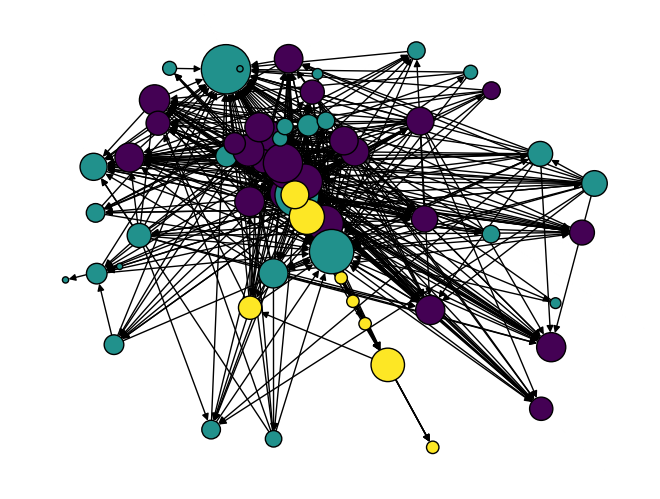

In [121]:
color = kmeans.labels_
size = [n*20 for n in dict(nx.degree(wet)).values()]

nx.draw(wet, node_color=color, node_size=size, edgecolors='#000')

In [122]:
# removing vultures because they are the only taxon in the 6th trophic level and seem to be an outlier that could fit into
# level 5
dry.remove_node('Vultures')

In [123]:
# setting the graph to start in a "force atlas" layout similar to static visualization in Gephi
pos = nx.spring_layout(dry, seed=42) 

In [124]:
# drawing a plot of the actual dry network with trophic level as node color and degree as node size
alt.data_transformers.disable_max_rows()
actual_dry_viz = nxa.draw_networkx(dry, 
                        pos=pos, 
                        node_color='trophic_level', 
                        cmap = 'viridis', # matching color mapping of the model
                        edge_color='#000',
                        node_size='degree_centrality',
                        node_tooltip=['taxon', 'trophic_level']
                       )

actual_dry_viz.interactive()

alt.LayerChart(...)

In looking at the predictive visualization against the actual visualization of the dry network, there seems to be a relatively similar distribution of the trophic levels, though the actual dry visualization has an extra level. It also seems that the predictive model used community detection to place nodes into groups which may explain the variance between the two. However, it does seem that it did a good job in making a meaningful prediction of what the network would look like.

## Conclusion

My original research question was "Can I predict changes across the two seasons of the wetlands, and how do communities, cascading of the networks carbon exchanges, and node centrality play into how these predictions turn out?" In re-examining this, I have effectively been able to hit on all points of this. It seems that communities that exist, seem to match up relatively well with the actual trophic levels of the taxa observed. In modeling a trophic cascade I was able to see how the population of the ecosystem might change across the wet season and the dry season. We also saw that some of our most degree central nodes seemed mostly to be the apex predators of the network, with some variation between seasons. Finally I was able to effectively use machine learning to use link prediction, node classification and statistical modeling to assess how this network might change overtime. A future extension to this work may include help from participants who are more biologically versed, which would help the accuracy of the biological and ecological modeling. Additionally, a time-based simulation may provide a more accurate cascading and modeling of the change over time in the network. 

## References

Pajek Florida Ecosytem Wet Dataset: http://vlado.fmf.uni-lj.si/pub/networks/data/bio/foodweb/cypwet.paj

Pajek Florida Ecosystem Dry Dataset: http://vlado.fmf.uni-lj.si/pub/networks/data/bio/foodweb/cypdry.paj

Network Analysis of Trophic Dynamics in South Florida Ecosystems: https://www.researchgate.net/publication/237005295_Network_Analysis_of_Trophic_Dynamics_in_South_Florida_Ecosystems_FY_99_The_Graminoid_Ecosystem

Trophic Levels Image: https://microbenotes.com/trophic-level/

Modeling Trophic Cascades: https://www.biointeractive.org/classroom-resources/modeling-trophic-cascades